In [1]:
!pip install ultralytics -q

from ultralytics import YOLO
import os
import glob
import matplotlib.pyplot as plt
from PIL import Image

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.5/46.5 kB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 20.2 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.4/78.4 kB 5.3 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.8 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/usage/settings.


In [2]:
print(os.listdir("/kaggle/input/datasets/chentaojie/team16-rock-size-detection-dataset"))

['3Typesfield-rock-detection.yolov8']


In [3]:
import os

data_yaml = "/kaggle/input/datasets/chentaojie/team16-rock-size-detection-dataset/3Typesfield-rock-detection.yolov8/data.yaml"

print(os.path.exists(data_yaml))
print(data_yaml)

True
/kaggle/input/datasets/chentaojie/team16-rock-size-detection-dataset/3Typesfield-rock-detection.yolov8/data.yaml


In [4]:
model = YOLO("yolov8s.pt")

results = model.train(
    data=data_yaml,
    imgsz=640,
    epochs=100,
    batch=16,
    device=0,
    project="/kaggle/working/runs",
    name="rock_yolov8s_100epochs_fixed",
    exist_ok=True,
    patience=20,
    plots=True
)

Ultralytics 8.4.156 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)


KeyboardInterrupt: 

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

result_img = "/kaggle/working/runs/rock_yolov8s_100epochs_fixed/results.png"

img = Image.open(result_img)

plt.figure(figsize=(12,8))
plt.imshow(img)
plt.axis("off")
plt.show()

In [ ]:
cm_img = "/kaggle/working/runs/rock_yolov8s_100epochs_fixed/confusion_matrix.png"

img = Image.open(cm_img)

plt.figure(figsize=(8,8))
plt.imshow(img)
plt.axis("off")
plt.show()

In [ ]:
from ultralytics import YOLO

best_model = YOLO("/kaggle/working/runs/rock_yolov8s_100epochs_fixed/weights/best.pt")

metrics = best_model.val()

In [ ]:
from ultralytics import YOLO
import random
import glob
from PIL import Image
import matplotlib.pyplot as plt

model = YOLO("/kaggle/working/runs/rock_yolov8s_100epochs_fixed/weights/best.pt")

test_imgs = glob.glob("/kaggle/input/datasets/chentaojie/team16-rock-size-detection-dataset/3Typesfield-rock-detection.yolov8/test/images/*")

sample_imgs = random.sample(test_imgs, min(5, len(test_imgs)))

for img_path in sample_imgs:
    results = model.predict(
        source=img_path,
        conf=0.5,
        save=False
    )

    result_img = results[0].plot()

    plt.figure(figsize=(10,8))
    plt.imshow(result_img)
    plt.title(os.path.basename(img_path))
    plt.axis("off")
    plt.show()

In [ ]:
from ultralytics import YOLO

model = YOLO("yolov8s.pt")

results = model.train(
    data=data_yaml,
    imgsz=640,
    epochs=100,
    batch=16,
    device=0,

    project="/kaggle/working/runs",
    name="rock_yolov8s_rotation_bg",
    exist_ok=True,

    patience=20,
    plots=True,

    
    degrees=180.0,
    translate=0.10,
    scale=0.30,
    shear=5.0,
    perspective=0.0005,

    
    fliplr=0.5,
    flipud=0.5
)

In [ ]:
from ultralytics import YOLO
from PIL import Image
import matplotlib.pyplot as plt
import random
import glob
import os


best_path = "/kaggle/working/runs/rock_yolov8s_100epochs_fixed/weights/best.pt"

print("模型是否存在：", os.path.exists(best_path))

model = YOLO(best_path)

test_images_dir = "/kaggle/input/datasets/chentaojie/team16-rock-size-detection-dataset/3Typesfield-rock-detection.yolov8/test/images"

test_images = (
    glob.glob(test_images_dir + "/*.jpg") +
    glob.glob(test_images_dir + "/*.jpeg") +
    glob.glob(test_images_dir + "/*.png")
)

print("测试图片数量：", len(test_images))

if len(test_images) == 0:
    raise FileNotFoundError("测试图片目录中没有找到图片，请检查 test_images_dir。")
img_path = random.choice(test_images)

print("随机抽取的图片：", img_path)

img = Image.open(img_path).convert("RGB")

angles = [0, 90, 180, 270]

plt.figure(figsize=(12, 12))

for i, angle in enumerate(angles):
    rotated = img.rotate(angle, expand=True)

    result = model.predict(
        source=rotated,
        conf=0.3,
        imgsz=640,
        verbose=False
    )[0]
    pred = result.plot()[..., ::-1]

    plt.subplot(2, 2, i + 1)
    plt.imshow(pred)
    plt.title(
        f"Rotation: {angle}° | "
        f"Detections: {len(result.boxes)}"
    )
    plt.axis("off")

plt.tight_layout()
plt.show()

In [6]:
# =========================
# 1. Train YOLOv8s with rotation + background augmentation
# =========================

from ultralytics import YOLO

model = YOLO("yolov8s.pt")

results = model.train(
    data=data_yaml,
    imgsz=640,
    epochs=100,
    batch=16,
    device=0,

    project="/kaggle/working/runs",
    name="rock_yolov8s_rotation_background",
    exist_ok=True,
    patience=20,
    plots=True,

    # rotation augmentation
    degrees=180.0,
    fliplr=0.5,
    flipud=0.5,

    # light geometric augmentation
    translate=0.10,
    scale=0.25,
    shear=3.0,

    # colour / lighting augmentation
    hsv_h=0.015,
    hsv_s=0.40,
    hsv_v=0.30,

    # scene composition augmentation
    mosaic=0.8,
    mixup=0.05,
    close_mosaic=10,
        workers=2,
    cache=False
)

Ultralytics 8.4.156 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/input/datasets/chentaojie/team16-rock-size-detection-dataset/3Typesfield-rock-detection.yolov8/data.yaml, degrees=180.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.5, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.4, hsv_v=0.3, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.05, mode=train, model=yolov8s.pt, momentum=0

/usr/local/lib/python3.12/dist-packages/ray/train/_internal/session.py:676: UserWarning: `get_trial_id` is meant to only be called inside a function that is executed by a Tuner or Trainer. Returning `None`.
  warnings.warn(


      2/100       4.7G      1.615      1.974      1.547          5        640: 100% ━━━━━━━━━━━━ 39/39 1.8it/s 22.3s0.8s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 6/6 1.4it/s 4.3s0.4s
                   all        187        345       0.25      0.535      0.366      0.128

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      3/100       4.7G      1.653      1.805      1.539         10        640: 100% ━━━━━━━━━━━━ 39/39 1.7it/s 22.9s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 6/6 1.4it/s 4.3s0.4s
                   all        187        345      0.539      0.393      0.202     0.0538

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      4/100       4.7G      1.654      1.828      1.548          3        640: 100% ━━━━━━━━━━━━ 39/39 1.7it/s 22.9s0.6s
                 Class     Images  Instanc

In [7]:
# =========================
# 2. SAHI sliced inference
# =========================

!pip install -q sahi ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 151.9/151.9 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.9/115.9 kB 3.9 MB/s eta 0:00:00


In [12]:
import os
import glob
import random
import yaml
from pathlib import Path


best_model_path = "/kaggle/working/runs/rock_yolov8s_rotation_background/weights/best.pt"

print("Model exists:", os.path.exists(best_model_path), best_model_path)

with open(data_yaml, "r") as f:
    data_cfg = yaml.safe_load(f)

print(data_cfg)

Model exists: True /kaggle/working/runs/rock_yolov8s_rotation_background/weights/best.pt
{'train': '../train/images', 'val': '../valid/images', 'test': '../test/images', 'nc': 3, 'names': ['LargeRock', 'MediumRock', 'SmallRock'], 'roboflow': {'workspace': 'taojies-workspace', 'project': 'field-rock-detection', 'version': 'dataset', 'license': 'CC BY 4.0', 'url': 'https://universe.roboflow.com/taojies-workspace/field-rock-detection/dataset/dataset'}}


In [14]:
import os
import glob
from pathlib import Path

search_roots = ["/kaggle/working", "/kaggle/input"]

image_exts = ["*.jpg", "*.jpeg", "*.png", "*.bmp", "*.webp"]

found_images = []

for root in search_roots:
    for ext in image_exts:
        found_images.extend(glob.glob(f"{root}/**/{ext}", recursive=True))

print("Total images found:", len(found_images))

for p in found_images[:30]:
    print(p)

Total images found: 1302
/kaggle/working/runs/rock_yolov8s_rotation_background/labels.jpg
/kaggle/working/runs/rock_yolov8s_rotation_background/val_batch1_labels.jpg
/kaggle/working/runs/rock_yolov8s_rotation_background/train_batch1.jpg
/kaggle/working/runs/rock_yolov8s_rotation_background/train_batch3510.jpg
/kaggle/working/runs/rock_yolov8s_rotation_background/val_batch2_labels.jpg
/kaggle/working/runs/rock_yolov8s_rotation_background/val_batch1_pred.jpg
/kaggle/working/runs/rock_yolov8s_rotation_background/train_batch3511.jpg
/kaggle/working/runs/rock_yolov8s_rotation_background/train_batch3512.jpg
/kaggle/working/runs/rock_yolov8s_rotation_background/train_batch0.jpg
/kaggle/working/runs/rock_yolov8s_rotation_background/train_batch2.jpg
/kaggle/working/runs/rock_yolov8s_rotation_background/val_batch0_labels.jpg
/kaggle/working/runs/rock_yolov8s_rotation_background/val_batch0_pred.jpg
/kaggle/working/runs/rock_yolov8s_rotation_background/val_batch2_pred.jpg
/kaggle/working/runs/rock

In [15]:
import random

sample_images = random.sample(found_images, min(10, len(found_images)))

print("Sample images:")
for p in sample_images:
    print(p)

Sample images:
/kaggle/input/datasets/chentaojie/team16-rock-size-detection-dataset/3Typesfield-rock-detection.yolov8/train/images/ChatGPT Image 2026年6月21日 16_51_49 (2)_png.rf.mej4qf3mEvQnkrf58Sig.png
/kaggle/input/datasets/chentaojie/team16-rock-size-detection-dataset/3Typesfield-rock-detection.yolov8/train/images/ChatGPT Image 2026年6月21日 18_11_06 (5)_png.rf.ILaSGC79aLCfQs4iNu82.png
/kaggle/input/datasets/chentaojie/team16-rock-size-detection-dataset/3Typesfield-rock-detection.yolov8/valid/images/ChatGPT Image 2026年6月18日 23_36_24 (5)_png.rf.AhlVka0GMcqIU5ULTR0B.png
/kaggle/input/datasets/chentaojie/team16-rock-size-detection-dataset/3Typesfield-rock-detection.yolov8/train/images/ChatGPT Image 2026年6月13日 22_56_25 (1)_png.rf.nd8NWOpov8flhwyJvRoe.png
/kaggle/input/datasets/chentaojie/team16-rock-size-detection-dataset/3Typesfield-rock-detection.yolov8/train/images/20250617_122203_jpg.rf.phBLC9uRfEvvaC47IwcK.jpg
/kaggle/input/datasets/chentaojie/team16-rock-size-detection-dataset/3Typesfi

In [16]:
from pathlib import Path
from sahi import AutoDetectionModel
from sahi.predict import get_sliced_prediction

best_model_path = "/kaggle/working/runs/rock_yolov8s_rotation_background/weights/best.pt"

detection_model = AutoDetectionModel.from_pretrained(
    model_type="ultralytics",
    model_path=best_model_path,
    confidence_threshold=0.25,
    device="cuda:0"
)

sahi_output_dir = Path("/kaggle/working/sahi_random10_visuals")
sahi_output_dir.mkdir(parents=True, exist_ok=True)

for img_path in sample_images:
    img_path = Path(img_path)
    print("Running SAHI on:", img_path)

    result = get_sliced_prediction(
        str(img_path),
        detection_model,
        slice_height=640,
        slice_width=640,
        overlap_height_ratio=0.2,
        overlap_width_ratio=0.2,
        postprocess_type="NMS",
        postprocess_match_metric="IOU",
        postprocess_match_threshold=0.5
    )

    result.export_visuals(
        export_dir=str(sahi_output_dir),
        file_name=img_path.stem
    )

print("Saved to:", sahi_output_dir)

Running SAHI on: /kaggle/input/datasets/chentaojie/team16-rock-size-detection-dataset/3Typesfield-rock-detection.yolov8/train/images/ChatGPT Image 2026年6月21日 16_51_49 (2)_png.rf.mej4qf3mEvQnkrf58Sig.png
Performing prediction on 6 slices.
Running SAHI on: /kaggle/input/datasets/chentaojie/team16-rock-size-detection-dataset/3Typesfield-rock-detection.yolov8/train/images/ChatGPT Image 2026年6月21日 18_11_06 (5)_png.rf.ILaSGC79aLCfQs4iNu82.png
Performing prediction on 6 slices.
Running SAHI on: /kaggle/input/datasets/chentaojie/team16-rock-size-detection-dataset/3Typesfield-rock-detection.yolov8/valid/images/ChatGPT Image 2026年6月18日 23_36_24 (5)_png.rf.AhlVka0GMcqIU5ULTR0B.png
Performing prediction on 6 slices.
Running SAHI on: /kaggle/input/datasets/chentaojie/team16-rock-size-detection-dataset/3Typesfield-rock-detection.yolov8/train/images/ChatGPT Image 2026年6月13日 22_56_25 (1)_png.rf.nd8NWOpov8flhwyJvRoe.png
Performing prediction on 6 slices.
Running SAHI on: /kaggle/input/datasets/chentaoj

Visualized images: 10


/tmp/ipykernel_58/730895043.py:20: UserWarning: Glyph 24180 (\N{CJK UNIFIED IDEOGRAPH-5E74}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_58/730895043.py:20: UserWarning: Glyph 26376 (\N{CJK UNIFIED IDEOGRAPH-6708}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_58/730895043.py:20: UserWarning: Glyph 26085 (\N{CJK UNIFIED IDEOGRAPH-65E5}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


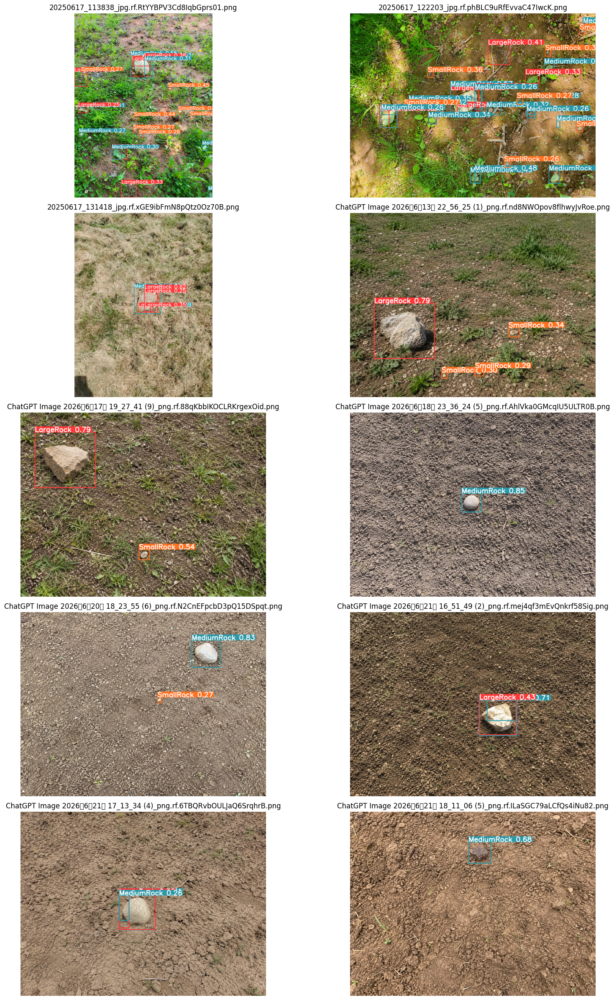

In [19]:
import matplotlib.pyplot as plt
from PIL import Image
import glob
from pathlib import Path

visual_paths = sorted(glob.glob(str(sahi_output_dir / "*.png")))

print("Visualized images:", len(visual_paths))

plt.figure(figsize=(18, 24))

for i, vis_path in enumerate(visual_paths[:10]):
    img = Image.open(vis_path)

    plt.subplot(5, 2, i + 1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(Path(vis_path).name)

plt.tight_layout()
plt.show()

/tmp/ipykernel_58/1342429107.py:45: UserWarning: Glyph 24180 (\N{CJK UNIFIED IDEOGRAPH-5E74}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_58/1342429107.py:45: UserWarning: Glyph 26376 (\N{CJK UNIFIED IDEOGRAPH-6708}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_58/1342429107.py:45: UserWarning: Glyph 26085 (\N{CJK UNIFIED IDEOGRAPH-65E5}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_58/1342429107.py:45: UserWarning: Glyph 19978 (\N{CJK UNIFIED IDEOGRAPH-4E0A}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_58/1342429107.py:45: UserWarning: Glyph 21320 (\N{CJK UNIFIED IDEOGRAPH-5348}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_58/1342429107.py:45: UserWarning: Glyph 19979 (\N{CJK UNIFIED IDEOGRAPH-4E0B}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 19978 (\N{CJK U

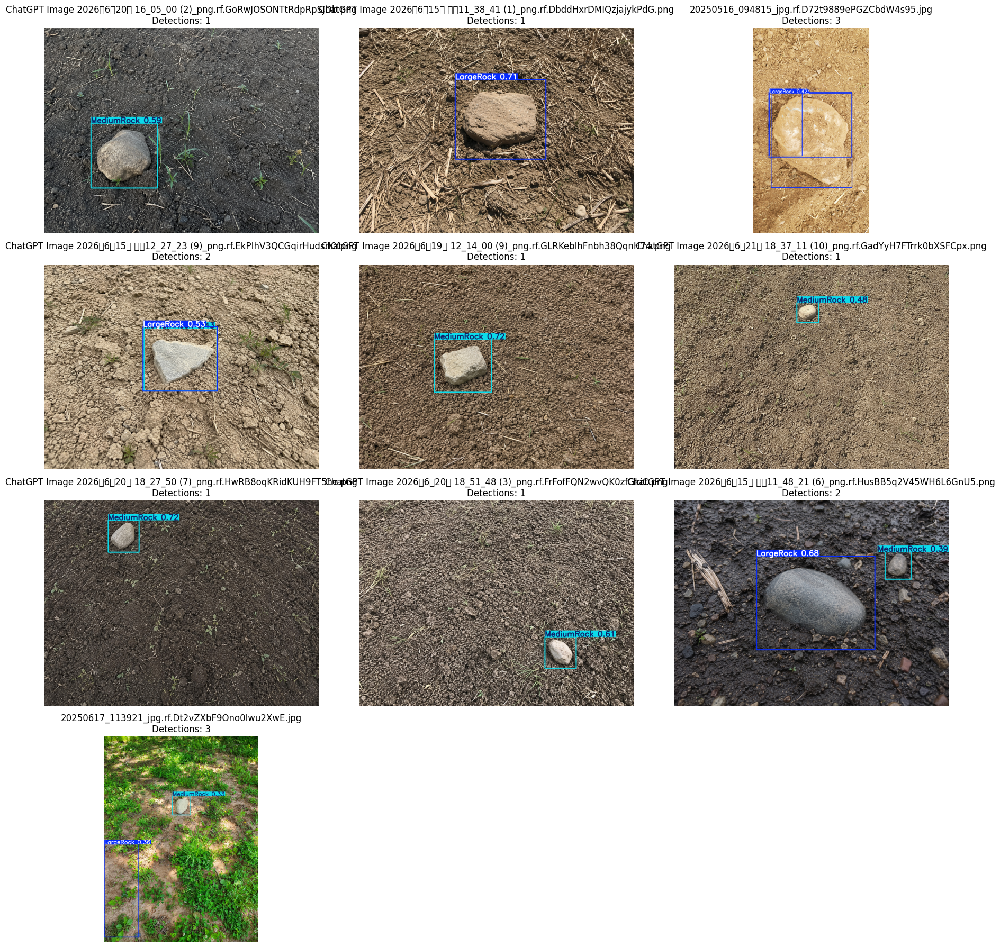

In [6]:
from ultralytics import YOLO
from PIL import Image
import matplotlib.pyplot as plt
import glob
import random
import os

background_model = YOLO(
    "/kaggle/working/runs/rock_yolov8s_rotation_background/weights/best.pt"
)

test_images_dir = "/kaggle/input/datasets/chentaojie/team16-rock-size-detection-dataset/3Typesfield-rock-detection.yolov8/test/images"

test_images = (
    glob.glob(test_images_dir + "/*.jpg") +
    glob.glob(test_images_dir + "/*.jpeg") +
    glob.glob(test_images_dir + "/*.png")
)

if not test_images:
    raise FileNotFoundError("测试集目录中没有找到图片。")

random_images = random.sample(test_images, min(10, len(test_images)))

plt.figure(figsize=(18, 18))

for i, image_path in enumerate(random_images):
    result = background_model.predict(
        source=image_path,
        imgsz=640,
        conf=0.30,
        verbose=False
    )[0]

    prediction_image = result.plot()[..., ::-1]

    plt.subplot(4, 3, i + 1)
    plt.imshow(prediction_image)
    plt.axis("off")
    plt.title(
        f"{os.path.basename(image_path)}\n"
        f"Detections: {len(result.boxes)}"
    )

plt.tight_layout()
plt.show()

In [14]:
from ultralytics import YOLO
import os

best_path = "/kaggle/working/runs/rock_yolov8s_rotation_background/weights/best.pt"

print("Does the model exist?：", os.path.exists(best_path))

model = YOLO(best_path)

onnx_path = model.export(
    format="onnx",
    imgsz=640,
    batch=1,
    simplify=True
)

print("ONNX model path：", onnx_path)

Does the model exist?： True
Ultralytics 8.4.127 🚀 Python-3.12.13 torch-2.10.0+cu128 CPU (Intel Xeon CPU @ 2.00GHz)
Model summary (fused): 73 layers, 11,126,745 parameters, 0 gradients, 28.4 GFLOPs

PyTorch: starting from '/kaggle/working/runs/rock_yolov8s_rotation_background/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 7, 8400) (21.5 MB)

ONNX: starting export with onnx 1.22.0 opset 20...
ONNX: slimming with onnxslim 0.1.96...
ONNX: export success ✅ 1.8s, saved as '/kaggle/working/runs/rock_yolov8s_rotation_background/weights/best.onnx' (42.7 MB)

Export complete (2.4s)
Results saved to /kaggle/working/runs/rock_yolov8s_rotation_background/weights/best.onnx
Predict:         yolo predict task=detect model=/kaggle/working/runs/rock_yolov8s_rotation_background/weights/best.onnx imgsz=640 
Validate:        yolo val task=detect model=/kaggle/working/runs/rock_yolov8s_rotation_background/weights/best.onnx imgsz=640 data=/kaggle/input/datasets/chentaojie/tea

Loading /kaggle/working/runs/rock_yolov8s_rotation_background/weights/best.onnx for ONNX Runtime inference...
requirements: Ultralytics requirement ['onnxruntime-gpu'] not found, attempting AutoUpdate...
Using Python 3.12.13 environment at: /usr
Resolved 5 packages in 273ms
Prepared 1 package in 2.87s
Installed 1 package in 108ms
 + onnxruntime-gpu==1.29.0

requirements: AutoUpdate success ✅ 3.4s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect

WARNING ⚠️ CUDA requested but CUDAExecutionProvider not available. Using CPU...
Using ONNX Runtime 1.29.0 with CPUExecutionProvider


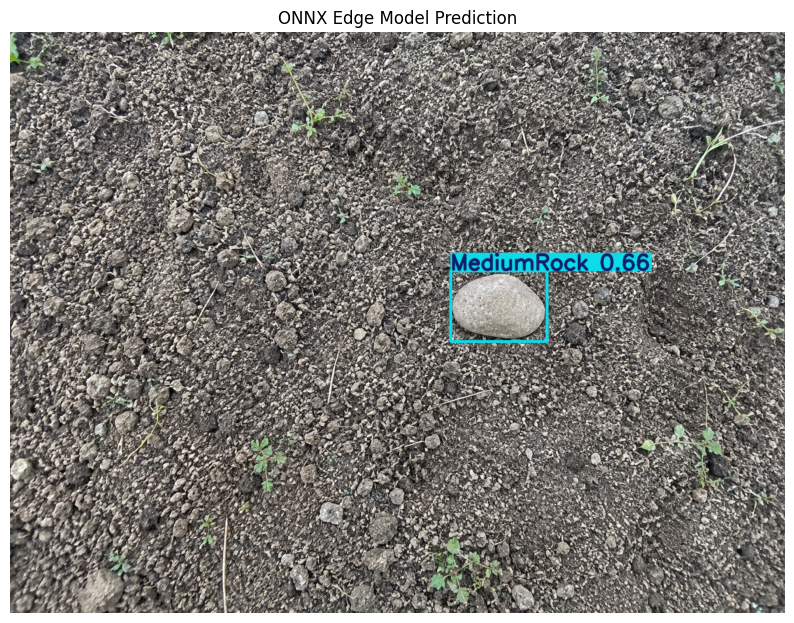

In [8]:
from ultralytics import YOLO
import glob
import random
import matplotlib.pyplot as plt

onnx_path = "/kaggle/working/runs/rock_yolov8s_rotation_background/weights/best.onnx"

onnx_model = YOLO(onnx_path)

test_images_dir = "/kaggle/input/datasets/chentaojie/team16-rock-size-detection-dataset/3Typesfield-rock-detection.yolov8/test/images"

test_images = (
    glob.glob(test_images_dir + "/*.jpg") +
    glob.glob(test_images_dir + "/*.jpeg") +
    glob.glob(test_images_dir + "/*.png")
)

test_img = random.choice(test_images)

result = onnx_model.predict(
    source=test_img,
    imgsz=640,
    conf=0.3,
    verbose=False
)[0]

pred = result.plot()[..., ::-1]

plt.figure(figsize=(10, 8))
plt.imshow(pred)
plt.axis("off")
plt.title("ONNX Edge Model Prediction")
plt.show()

In [9]:
metrics = onnx_model.val(
    data=data_yaml,
    imgsz=640
)

print("Precision:", metrics.box.mp)
print("Recall:", metrics.box.mr)
print("mAP50:", metrics.box.map50)
print("mAP50-95:", metrics.box.map)

Ultralytics 8.4.127 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
Loading /kaggle/working/runs/rock_yolov8s_rotation_background/weights/best.onnx for ONNX Runtime inference...
WARNING ⚠️ CUDA requested but CUDAExecutionProvider not available. Using CPU...
Using ONNX Runtime 1.29.0 with CPUExecutionProvider
Setting batch=1 input of shape (1, 3, 640, 640)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2521.6±720.5 MB/s, size: 9190.7 KB)
val: Scanning /kaggle/input/datasets/chentaojie/team16-rock-size-detection-dataset/3Typesfield-rock-detection.yolov8/valid/labels... 191 images, 0 backgrounds, 81 corrupt: 100% ━━━━━━━━━━━━ 268/268 32.4it/s 8.3s<0.1s
val: /kaggle/input/datasets/chentaojie/team16-rock-size-detection-dataset/3Typesfield-rock-detection.yolov8/valid/images/20250516_080512_jpg.rf.0jRWAfNBAfivoPM3eZ9a.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/datasets/chentaojie/team16-rock-size-detection-dataset/3Typesfield-rock-de

In [13]:
import time
import numpy as np

times = []

for _ in range(5):
    onnx_model.predict(
        source=test_img,
        imgsz=640,
        conf=0.3,
        verbose=False
    )

for _ in range(30):
    start = time.time()

    onnx_model.predict(
        source=test_img,
        imgsz=640,
        conf=0.3,
        verbose=False
    )

    end = time.time()
    times.append(end - start)

avg_time = np.mean(times)
fps = 1 / avg_time

print(f"averager time: {avg_time * 1000:.2f} ms")
print(f"FPS: {fps:.2f}")

averager time: 236.61 ms
FPS: 4.23


In [12]:
with open("onnx_speed_test.txt","w") as f:
    f.write(
        f"Average inference time: {avg_time*1000:.2f} ms\n"
        f"FPS: {fps:.2f}"
    )